<a href="https://colab.research.google.com/github/marcocarrillodiaz/BEDU-MODULO-5/blob/main/Proyecto_BEDU_M5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from lightgbm import LGBMClassifier 

from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier

from pylab import rcParams
 
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from imblearn.ensemble import BalancedBaggingClassifier
 
from collections import Counter

import random, math
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import datetime
#from cryptocmd import CmcScraper

**Cargamos el archivo y observamos las primeras filas**

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/BEDU/Modulo5/creditcard.csv")#, index_col=0)
df.head(n=5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [ ]:
df[['Amount', 'V1','V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11','V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21','V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28']].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Amount,284807.0,8.834962e+01,250.120109,0.000000,5.600000,22.000000,77.165000,25691.160000
V1,284807.0,1.168375e-15,1.958696,-56.407510,-0.920373,0.018109,1.315642,2.454930
V2,284807.0,3.416908e-16,1.651309,-72.715728,-0.598550,0.065486,0.803724,22.057729
V3,284807.0,-1.379537e-15,1.516255,-48.325589,-0.890365,0.179846,1.027196,9.382558
V4,284807.0,2.074095e-15,1.415869,-5.683171,-0.848640,-0.019847,0.743341,16.875344
V5,284807.0,9.604066e-16,1.380247,-113.743307,-0.691597,-0.054336,0.611926,34.801666
V6,284807.0,1.487313e-15,1.332271,-26.160506,-0.768296,-0.274187,0.398565,73.301626
V7,284807.0,-5.556467e-16,1.237094,-43.557242,-0.554076,0.040103,0.570436,120.589494
V8,284807.0,1.213481e-16,1.194353,-73.216718,-0.208630,0.022358,0.327346,20.007208
V9,284807.0,-2.406331e-15,1.098632,-13.434066,-0.643098,-0.051429,0.597139,15.594995


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28


**Observemos cuantos registros y cuantos hay de cada clase**



In [ ]:
print(df.shape)
print(pd.value_counts(df['Class'], sort = True))

(284807, 31)
0    284315
1       492
Name: Class, dtype: int64


In [ ]:
LABELS=['Normal', 'Fraude']

**Observamos quue existen 204807 Registros y solo 492 con casos de fraude, lo cual representa el 0.17% de las muestras.**  

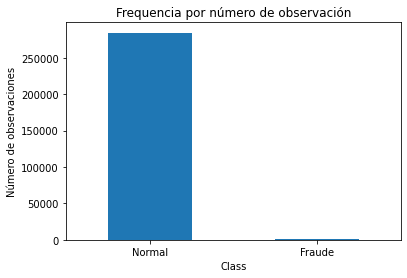

In [ ]:
count_classes = pd.value_counts(df['Class'], sort = True)
count_classes.plot(kind = 'bar', rot=0)
plt.xticks(range(2), ['Normal', 'Fraude'])
plt.title("Frequencia por número de observación")
plt.xlabel("Class")
plt.ylabel("Número de observaciones");

**Observamos inicialmente que tenemos un Dataset "*desbalanceado*"**
**Inicialmente trabajaremos con el Dataset tal cual está y posteriormente implementaremos una estrategia de balanceo para comparar resultados.**


In [ ]:
corr=df.corr()
corr

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,...,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323
V1,0.117396,1.000000e+00,4.135835e-16,-1.227819e-15,-9.215150e-16,1.812612e-17,-6.506567e-16,-1.005191e-15,-2.433822e-16,-1.513678e-16,...,-2.457409e-16,-4.290944e-16,6.168652e-16,-4.425156e-17,-9.605737e-16,-1.581290e-17,1.198124e-16,2.083082e-15,-0.227709,-0.101347
V2,-0.010593,4.135835e-16,1.000000e+00,3.243764e-16,-1.121065e-15,5.157519e-16,2.787346e-16,2.055934e-16,-5.377041e-17,1.978488e-17,...,-8.480447e-17,1.526333e-16,1.634231e-16,1.247925e-17,-4.478846e-16,2.057310e-16,-4.966953e-16,-5.093836e-16,-0.531409,0.091289
V3,-0.419618,-1.227819e-15,3.243764e-16,1.000000e+00,4.711293e-16,-6.539009e-17,1.627627e-15,4.895305e-16,-1.268779e-15,5.568367e-16,...,5.706192e-17,-1.133902e-15,-4.983035e-16,2.686834e-19,-1.104734e-15,-1.238062e-16,1.045747e-15,9.775546e-16,-0.210880,-0.192961
V4,-0.105260,-9.215150e-16,-1.121065e-15,4.711293e-16,1.000000e+00,-1.719944e-15,-7.491959e-16,-4.104503e-16,5.697192e-16,6.923247e-16,...,-1.949553e-16,-6.276051e-17,9.164206e-17,1.584638e-16,6.070716e-16,-4.247268e-16,3.977061e-17,-2.761403e-18,0.098732,0.133447
V5,0.173072,1.812612e-17,5.157519e-16,-6.539009e-17,-1.719944e-15,1.000000e+00,2.408382e-16,2.715541e-16,7.437229e-16,7.391702e-16,...,-3.920976e-16,1.253751e-16,-8.428683e-18,-1.149255e-15,4.808532e-16,4.319541e-16,6.590482e-16,-5.613951e-18,-0.386356,-0.094974
V6,-0.063016,-6.506567e-16,2.787346e-16,1.627627e-15,-7.491959e-16,2.408382e-16,1.000000e+00,1.191668e-16,-1.104219e-16,4.131207e-16,...,5.833316e-17,-4.705235e-19,1.046712e-16,-1.071589e-15,4.562861e-16,-1.357067e-16,-4.452461e-16,2.594754e-16,0.215981,-0.043643
V7,0.084714,-1.005191e-15,2.055934e-16,4.895305e-16,-4.104503e-16,2.715541e-16,1.191668e-16,1.000000e+00,3.344412e-16,1.122501e-15,...,-2.027779e-16,-8.898922e-16,-4.387401e-16,7.434913e-18,-3.094082e-16,-9.657637e-16,-1.782106e-15,-2.776530e-16,0.397311,-0.187257
V8,-0.036949,-2.433822e-16,-5.377041e-17,-1.268779e-15,5.697192e-16,7.437229e-16,-1.104219e-16,3.344412e-16,1.000000e+00,4.356078e-16,...,3.892798e-16,2.026927e-16,6.377260e-17,-1.047097e-16,-4.653279e-16,-1.727276e-16,1.299943e-16,-6.200930e-16,-0.103079,0.019875
V9,-0.008660,-1.513678e-16,1.978488e-17,5.568367e-16,6.923247e-16,7.391702e-16,4.131207e-16,1.122501e-15,4.356078e-16,1.000000e+00,...,1.936953e-16,-7.071869e-16,-5.214137e-16,-1.430343e-16,6.757763e-16,-7.888853e-16,-6.709655e-17,1.110541e-15,-0.044246,-0.097733


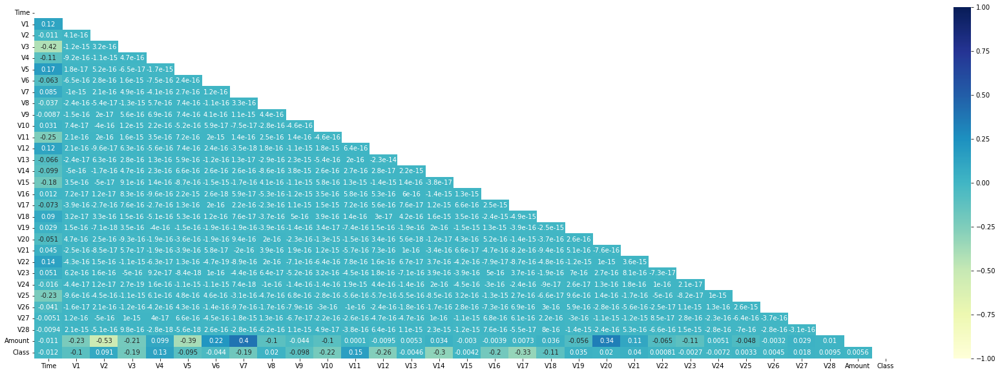

In [ ]:
plt.figure(figsize=(30,10))
mask0=np.triu(np.ones_like(corr))
sns.heatmap(corr, annot=True, cmap='YlGnBu', mask=mask0, vmin=-1, vmax=1)
plt.show()

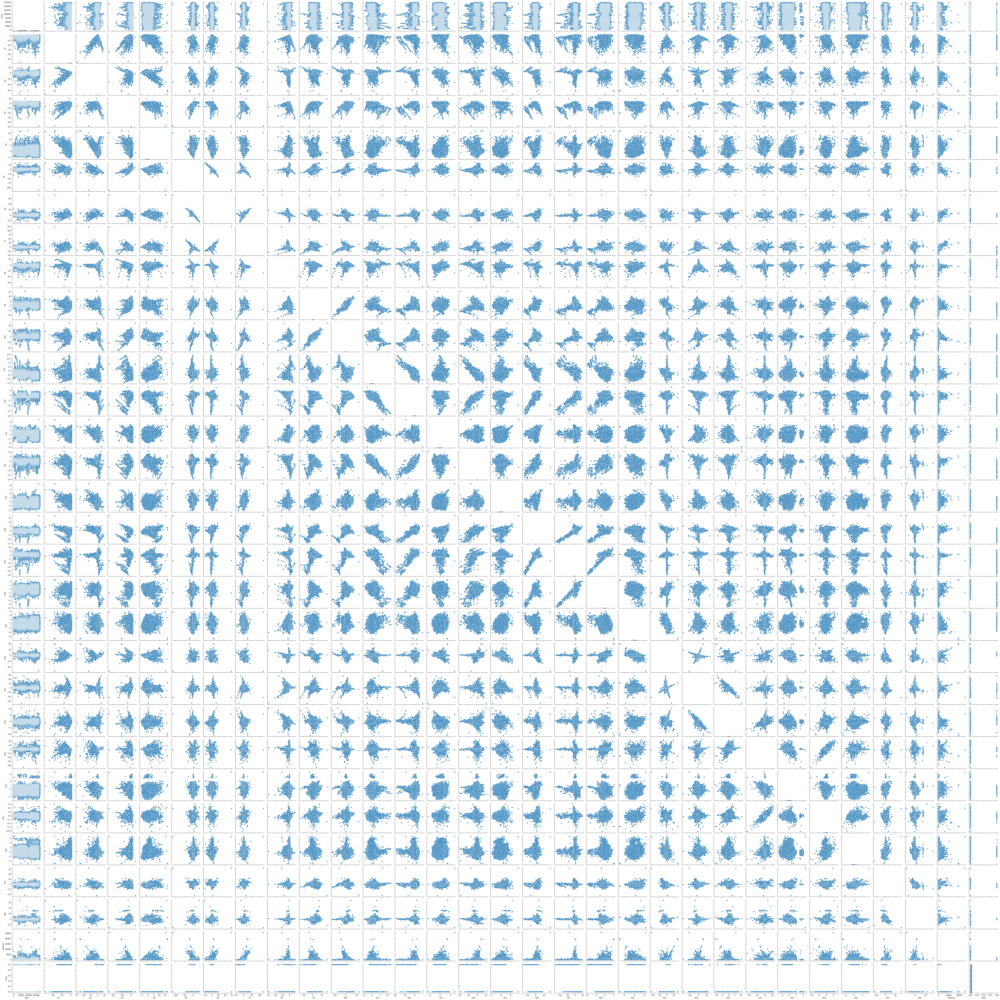

In [ ]:
sns.pairplot(df)

**Probamos el modelo sin balancear**

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  ConvergenceWarn

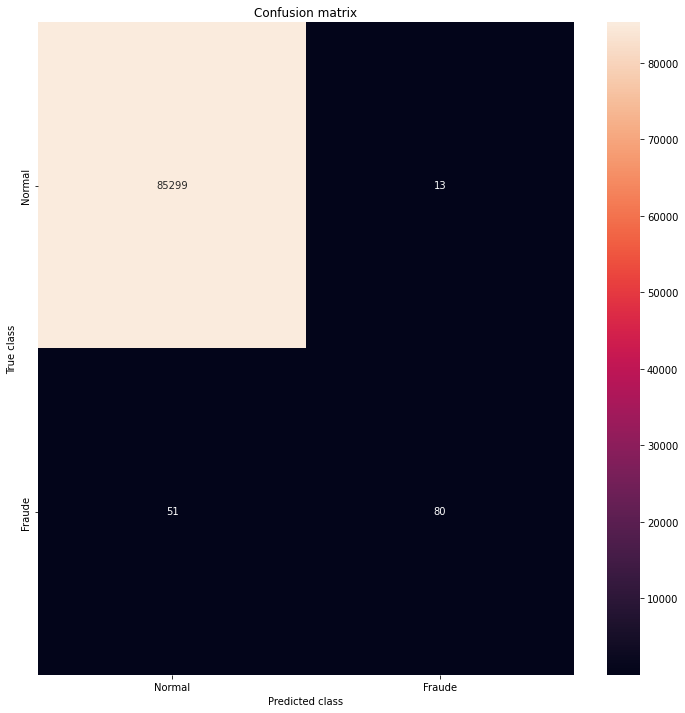

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85312
           1       0.86      0.61      0.71       131

    accuracy                           1.00     85443
   macro avg       0.93      0.81      0.86     85443
weighted avg       1.00      1.00      1.00     85443

Score del modelo: 0.999


In [ ]:
#definimos nuestras etiquetas y features
y = df['Class']
X = df.drop('Class', axis=1)

#dividimos en sets de entrenamiento y test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)
 
#creamos una función que crea el modelo
def run_model(X_train, X_test, y_train, y_test):
    clf_base = LogisticRegression(C=1.0,penalty='l2',random_state=1,solver="newton-cg")#, max_iter = 4000)
    clf_base.fit(X_train, y_train)
    return clf_base
 
#ejecutamos el modelo "tal cual"
model = run_model(X_train, X_test, y_train, y_test)
 
#definimos funciona para mostrar los resultados
def mostrar_resultados(y_test, pred_y):
    conf_matrix = confusion_matrix(y_test, pred_y)
    plt.figure(figsize=(12, 12))
    sns.heatmap(conf_matrix, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
    plt.title("Confusion matrix")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print (classification_report(y_test, pred_y))
 
pred_y = model.predict(X_test)
mostrar_resultados(y_test, pred_y)
print('Score del modelo: %.3f' % model.score(X,df['Class']))

En la Matriz de confusión observamos **45 fallos** y **78 aciertos**, obtenemos un **recall(tp / (tp + fn))**: 0.63, este es el valor que se pretende mejorar.**
La columna **"f1-score"** aunque presenta buenos resultados, sería incorrecto tomarlos por buenos ya que nuestro dataset presenta un claro desbalance por lo que lo que inicialmente podemos concluir que se trata de un **resultado parcial o engañoso**

Para resolver el problema de desbalanceo se implementa una estrategia de **Penalización** la cuál consiste en integrar el parámetro **weight = “balanced”** y con esto el algoritmo se encargará de equilibrar a la clase minoritaria durante el entrenamiento.

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  ConvergenceWarn

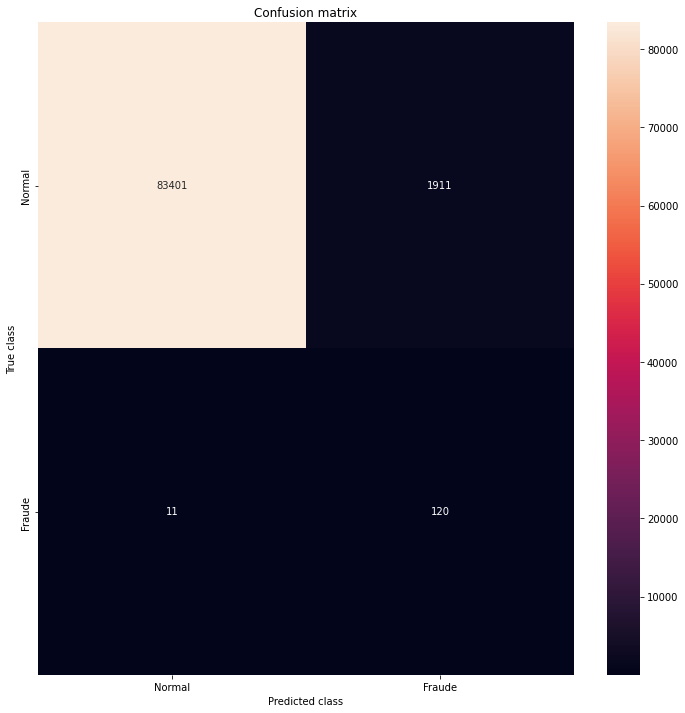

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     85312
           1       0.06      0.92      0.11       131

    accuracy                           0.98     85443
   macro avg       0.53      0.95      0.55     85443
weighted avg       1.00      0.98      0.99     85443

Score del modelo: 0.977


In [ ]:
def run_model_balanced(X_train, X_test, y_train, y_test):
    clf = LogisticRegression(C=1.0,penalty='l2',random_state=1,solver="newton-cg",class_weight="balanced")
    clf.fit(X_train, y_train)
    return clf

model = run_model_balanced(X_train, X_test, y_train, y_test)
pred_y = model.predict(X_test)
mostrar_resultados(y_test, pred_y)
print('Score del modelo: %.3f' % model.score(X,df['Class']))

Observamos una notable mejoría para la Clase: **FRAUDE** ya que se acertó en 111 y falló en 12, obteniendose un recall de 0.9.
La columna f1-score aunque muestra resultados mas pobres que el analisis anterior, se mejora la deteccion de fraudes; también es notable que los falsos positivos aumentaron, es decir se etiquetaron **1770** cuando no lo eran, sin embargo creo es mejor a fallar en casos de fraude.

**¿Que sigue?**

Ahora se buscará reducir la clase mayoritaria para obtener datos de entrenamiento con los que podamos trabajar con más modelos.

Para ello implementaremos algunas estrategias de balanceo adicionales: **Subsampling y Oversampling**

****Subsampling en la clase mayoritaria****

Es un algoritmo similar al k-nearest neighbor que selecciona los elementos a eliminar.

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  ConvergenceWarn

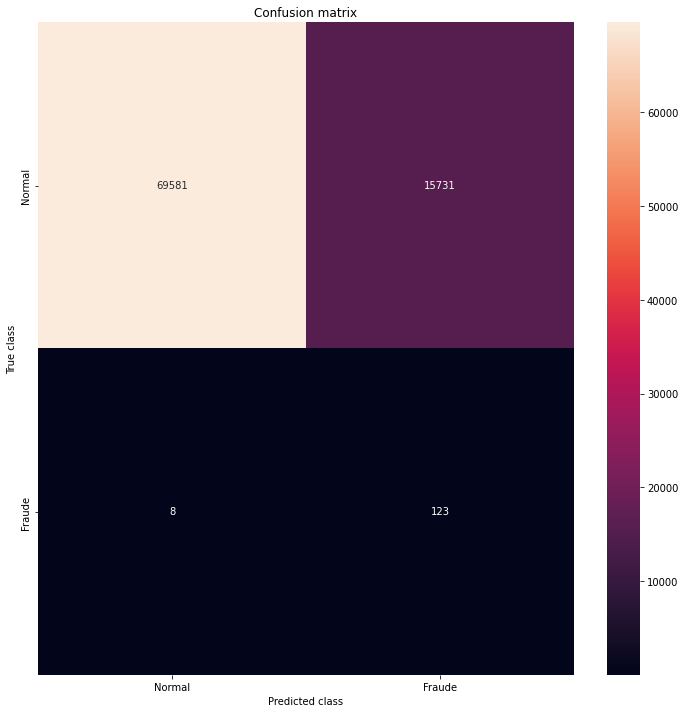

              precision    recall  f1-score   support

           0       1.00      0.82      0.90     85312
           1       0.01      0.94      0.02       131

    accuracy                           0.82     85443
   macro avg       0.50      0.88      0.46     85443
weighted avg       1.00      0.82      0.90     85443

Distribution before resampling Counter({0: 199003, 1: 361})
Distribution after resampling Counter({0: 361, 1: 361})
Score del modelo: 0.816


In [ ]:
nm = NearMiss()
X_train_res, y_train_res = nm.fit_resample(X_train, y_train)

model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test)
mostrar_resultados(y_test, pred_y)
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution after resampling {}".format(Counter(y_train_res)))
print('Score del modelo: %.3f' % model.score(X,df['Class']))

Observamos muy buenos resultados.
Tambien es muy drastica la reducción de muestras de clase **NORMAL**, pues se reducen de **198995** a **369** y con estas muestras entrenamos el modelo.

****Oversampling****

Por último probaremos crear muestras sinteticas de clase 1 mediante usando RandomOverSampler 

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/optimize.py:212: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  ConvergenceWarn

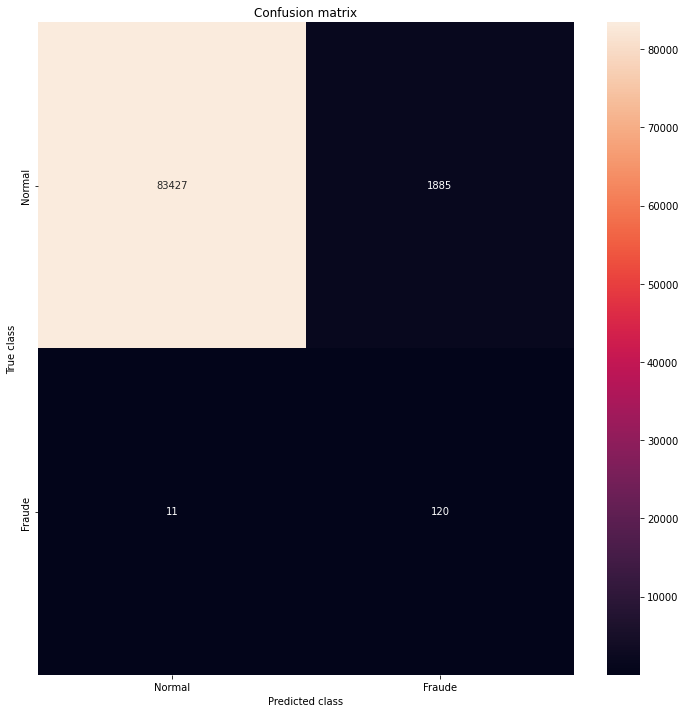

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     85312
           1       0.06      0.92      0.11       131

    accuracy                           0.98     85443
   macro avg       0.53      0.95      0.55     85443
weighted avg       1.00      0.98      0.99     85443

Distribution before resampling Counter({0: 199003, 1: 361})
Distribution after resampling Counter({0: 199003, 1: 199003})
Score del modelo: 0.977


In [ ]:
os =  RandomOverSampler(random_state=42)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)
 
model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test)
mostrar_resultados(y_test, pred_y)
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution after resampling {}".format(Counter(y_train_res)))
print('Score del modelo: %.3f' % model.score(X,df['Class']))

Tenemos un recall de 0.90, observamos que bajo un poco.

**Tomaremos por lo tanto la muestra de Oversampling para probar con otros modelos y observar resultados**

***
****Arboles de Decisión****
***

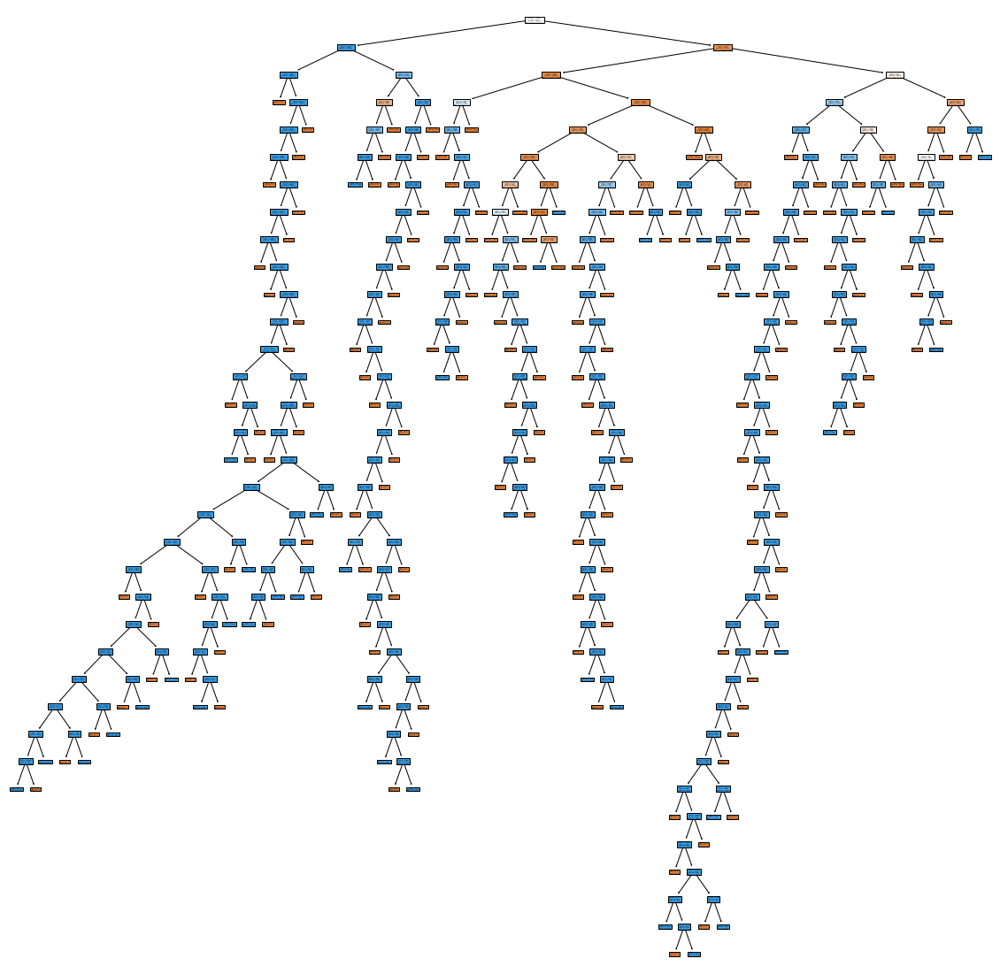

0.9997471972247873

In [ ]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

#X_train_res, X_test, y_train_res, y_test
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

dec_tree = DecisionTreeClassifier()
dec_tree.fit(X_train_res, y_train_res)

dec_tree.predict(X_test)

plt.figure(figsize=(20,20))

tree.plot_tree(dec_tree, filled=True)
plt.show()

X.columns[29]
dec_tree.score(X,df['Class'])


In [ ]:
print('Score del modelo: %.3f' % dec_tree.score(X,df['Class']))

Score del modelo: 1.000


****Random Forest****

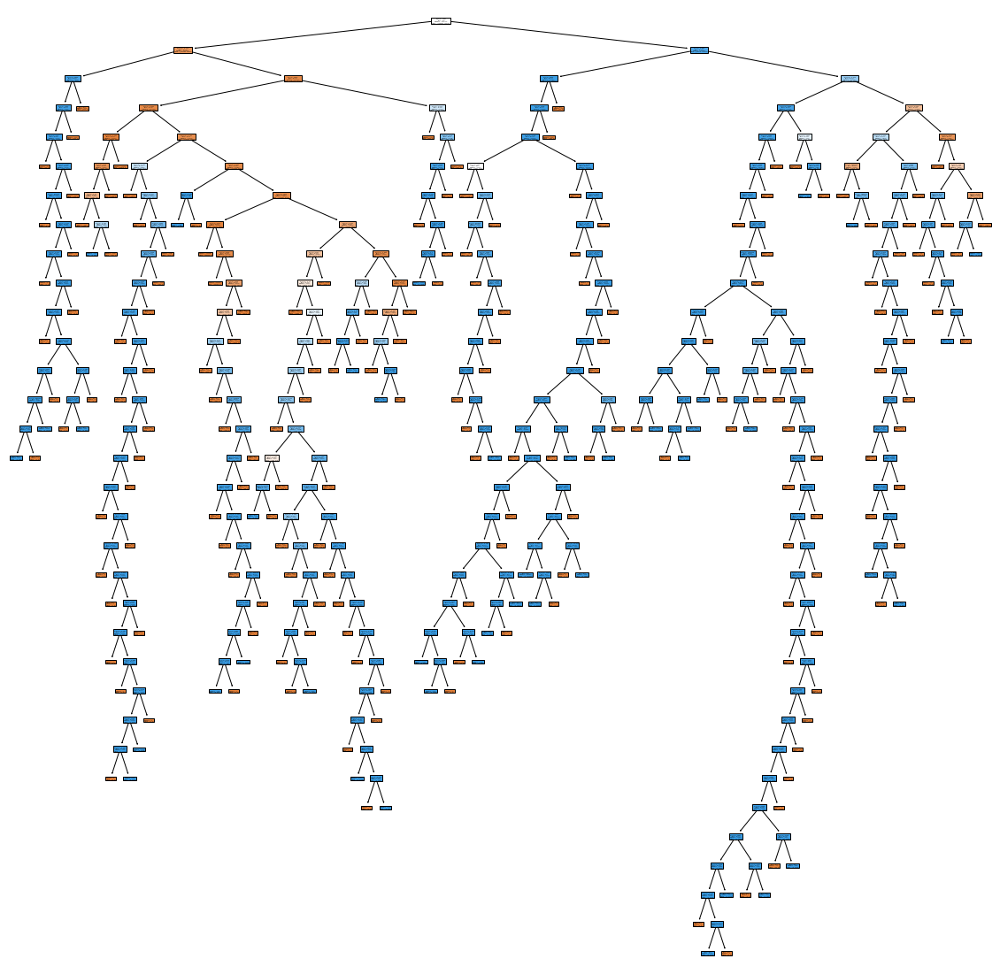

In [ ]:
from sklearn.ensemble import RandomForestClassifier
ran_for = RandomForestClassifier()

ran_for.fit(X_train_res,y_train_res)

ran_for.predict(X_test)

plt.figure(figsize=(20,20))

tree.plot_tree(ran_for[1], filled=True)
plt.show()

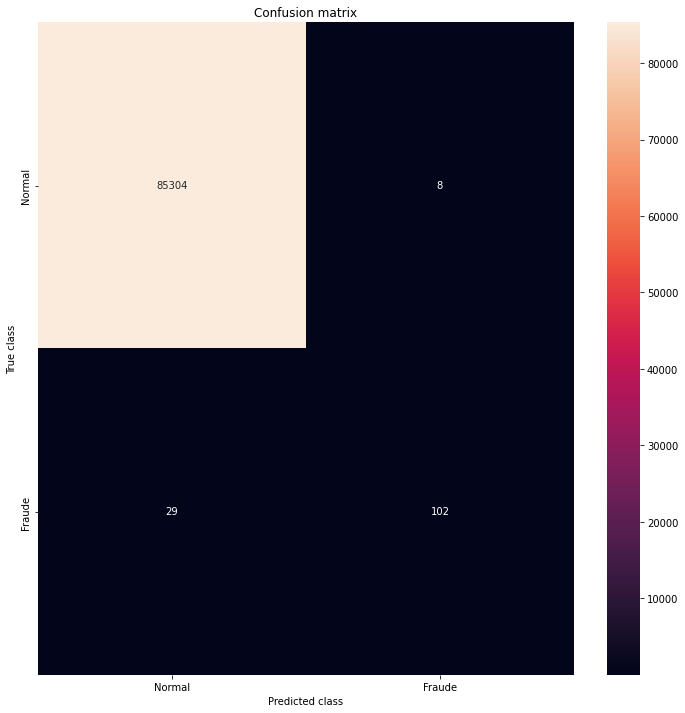

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85312
           1       0.93      0.78      0.85       131

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.92     85443
weighted avg       1.00      1.00      1.00     85443

De un total de 85443 puntos hubo 37 mal etiquetados
Score del modelo: 1.000


In [ ]:
mostrar_resultados(y_test, ran_for.predict(X_test))
print("De un total de %d puntos hubo %d mal etiquetados" % (X_test.shape[0], (y_test != ran_for.predict(X_test)).sum()))
print('Score del modelo: %.3f' % ran_for.score(X,df['Class']))

****Naive Bayes****

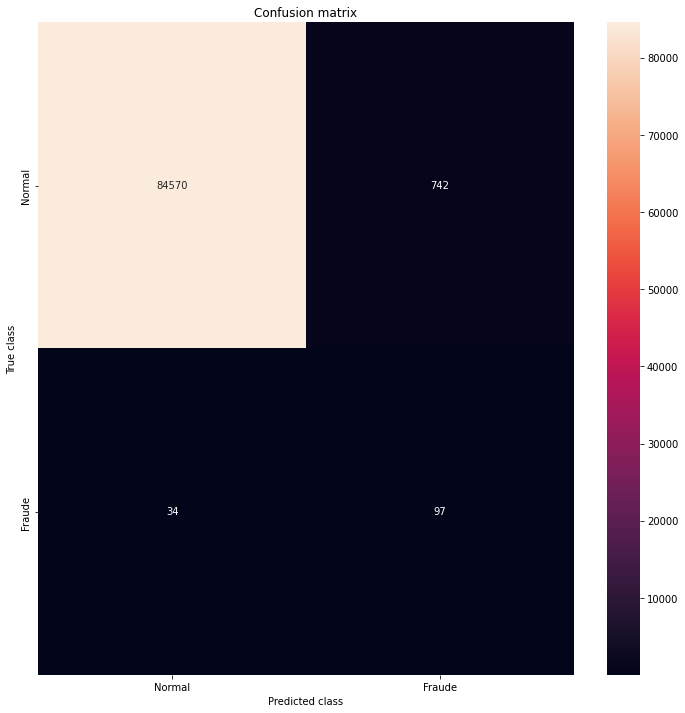

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     85312
           1       0.12      0.74      0.20       131

    accuracy                           0.99     85443
   macro avg       0.56      0.87      0.60     85443
weighted avg       1.00      0.99      0.99     85443

De un total de 85443 puntos hubo 776 mal etiquetados
Score del modelo: 0.991


In [ ]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()

gnb.fit(X_train_res, y_train_res)

nb_pred = gnb.predict(X_test)

mostrar_resultados(y_test, nb_pred)
print("De un total de %d puntos hubo %d mal etiquetados" % (X_test.shape[0], (y_test != nb_pred).sum()))
print('Score del modelo: %.3f' % gnb.score(X,df['Class']))

****K means****

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score

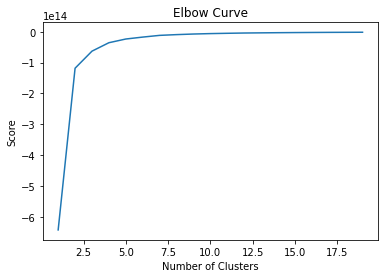

In [ ]:
Nc = range(1, 20)
Nc
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
label = kmeans.labels_

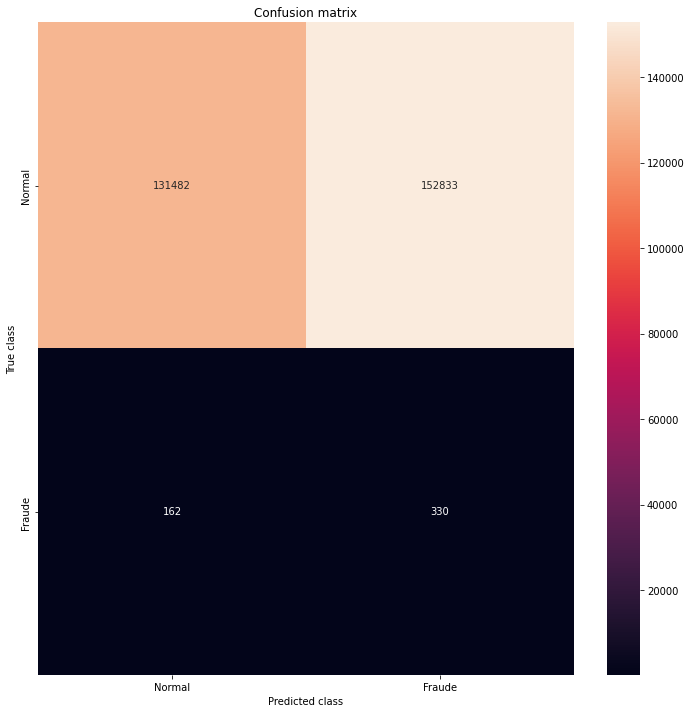

              precision    recall  f1-score   support

           0       1.00      0.46      0.63    284315
           1       0.00      0.67      0.00       492

    accuracy                           0.46    284807
   macro avg       0.50      0.57      0.32    284807
weighted avg       1.00      0.46      0.63    284807



In [ ]:
mostrar_resultados(df['Class'], label)

****Redes Neuronales****

In [ ]:
from sklearn.neural_network import MLPClassifier
NeuralNetwork = MLPClassifier(hidden_layer_sizes=(10,4),
                            max_iter=20000,
                            activation ='logistic',
                            tol= 1e-8)

NeuralNetwork.fit(X_train_res, y_train_res)
y_pred_nn = NeuralNetwork.predict(X_test)

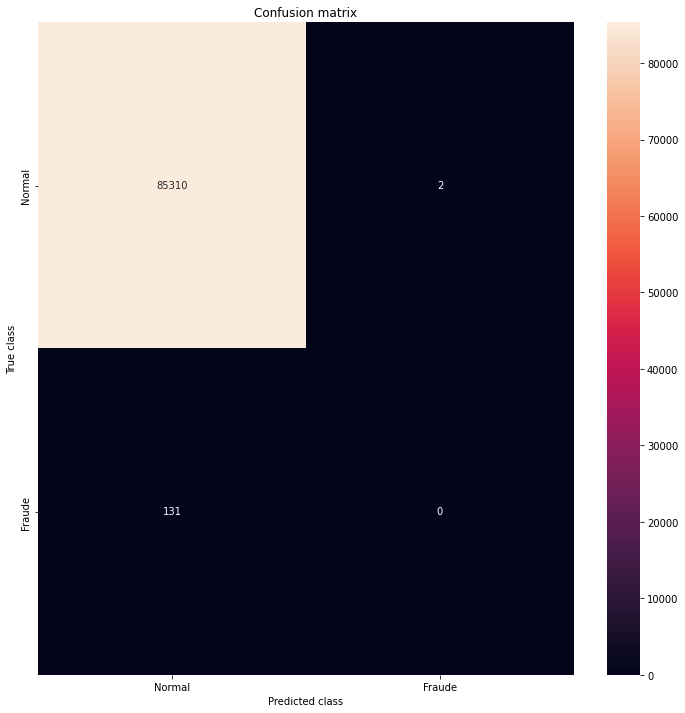

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85312
           1       0.00      0.00      0.00       131

    accuracy                           1.00     85443
   macro avg       0.50      0.50      0.50     85443
weighted avg       1.00      1.00      1.00     85443

De un total de 85443 puntos hubo 133 mal etiquetados
Score del modelo: 0.998


In [ ]:
mostrar_resultados(y_test, y_pred_nn)
print("De un total de %d puntos hubo %d mal etiquetados" % (X_test.shape[0], (y_test != y_pred_nn).sum()))
print('Score del modelo: %.3f' % NeuralNetwork.score(X,df['Class']))

****Máquina de Soporte Vectorial****

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline

SupportVectorMachine = SVC()
SupportVectorMachine.fit(X_train_res, y_train_res) 
y_pred_svm = SupportVectorMachine.predict(X_test) 

In [ ]:
mostrar_resultados(y_test, y_pred_svm)
print("De un total de %d puntos hubo %d mal etiquetados" % (X_test.shape[0], (y_test != y_pred_svm).sum()))
print('Score del modelo: %.3f' % SupportVectorMachine.score(X,df['Class']))